<a href="https://colab.research.google.com/github/ke-wen/ke-wen/blob/main/AP_Final_project/HateSpeechFineTune_Bert_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer learning

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir("/content/drive/MyDrive/AP_FYP")
!pwd

/content/drive/MyDrive/AP_FYP


In [ ]:
import pandas as pd

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from transformers import AutoTokenizer, AutoModel
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report
import torch

# Load dataset
dataset_path = 'data/HateSpeechDatasetBalanced.csv'

data = pd.read_csv(dataset_path)
print("Dataset shape:", data.shape)
#Data soures : https://www.kaggle.com/datasets/waalbannyantudre/hate-speech-detection-curated-dataset

Dataset shape: (726119, 2)


In [ ]:
# Train-test split
train_x, test_texts, train_y, test_labels = train_test_split(
    data['Content'], data['Label'], test_size=0.2, random_state=42
)

# Train-Val split
train_texts, val_texts, train_labels, val_labels = train_test_split(
   train_x, train_y,  test_size=0.2, random_state=42
)

print("Train dataset shape:", train_texts.shape)
print("Val dataset shape:", val_texts.shape)
print("Test dataset shape:", test_texts.shape)

Train dataset shape: (464716,)
Val dataset shape: (116179,)
Test dataset shape: (145224,)


# Fine-Tune Model
The transformers library allows you to fine-tune a model on a specific task using classes like Trainer or custom PyTorch code.


> **The GroNLP/hateBER**T model has approximately **110 million** parameters. This is based on its architecture, which is derived from the BERT base uncased model, a standard transformer architecture with **12 layers, 12 attention heads** , and a hidden size of **768**.


HateBERT is an English pre-trained BERT model obtained by further training the English BERT base uncased model with more than 1 million posts from banned communites from Reddit. The model has been developed as a collaboration between the University of Groningen, the university of Turin, and the University of Passau.


Model source : https://huggingface.co/GroNLP/hateBERT

## Approach 1: Using the Trainer API
* This simplifies the process:

1. Convert your dataset into Dataset objects.
1. Define a model head for you1. r task (e.g., classification).

In [ ]:
pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 26.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 18.5 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
from datasets import Dataset
# Convert data to Hugging Face Dataset
train_dataset = Dataset.from_dict({"text": train_texts, "label": train_labels})
val_dataset = Dataset.from_dict({"text": val_texts, "label": val_labels})
test_dataset = Dataset.from_dict({"text": test_texts, "label": test_labels})

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cuda


In [ ]:
from transformers import AutoModelForSequenceClassification
tokenizer = AutoTokenizer.from_pretrained("GroNLP/hateBERT")
# Tokenize
def preprocess(examples):
    return tokenizer(examples["text"], truncation=True, padding=True, max_length=512)
train_dataset = train_dataset.map(preprocess, batched=True)
val_dataset = val_dataset.map(preprocess, batched=True)
test_dataset = test_dataset.map(preprocess, batched=True)

# Load model for classification
model = AutoModelForSequenceClassification.from_pretrained("GroNLP/hateBERT", num_labels=2).to(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/151 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Map:   0%|          | 0/464716 [00:00<?, ? examples/s]

Map:   0%|          | 0/116179 [00:00<?, ? examples/s]

Map:   0%|          | 0/145224 [00:00<?, ? examples/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at GroNLP/hateBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
pip install wandb

In [ ]:
from transformers import TrainingArguments
from transformers import Trainer
# Training arguments
training_args = TrainingArguments(
    output_dir="./results",
    eval_strategy="epoch",
    save_strategy="epoch",
    learning_rate=7e-5,
    per_device_train_batch_size=64,
    per_device_eval_batch_size=64,
    num_train_epochs=4,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=100,
    load_best_model_at_end=True,
    metric_for_best_model="accuracy",

)

# Define evaluation metric
from sklearn.metrics import accuracy_score

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return {"accuracy": accuracy_score(labels, predictions)}

# Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)

# Train model
trainer.train()


<ipython-input-14-c65fb2d787bf>:29: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss,Accuracy
1,0.220900,0.227975,0.901996
2,0.161500,0.219552,0.913349
3,0.084200,0.273692,0.911137
4,0.048200,0.350318,0.914830


TrainOutput(global_step=29048, training_loss=0.13753783324473293, metrics={'train_runtime': 7973.8242, 'train_samples_per_second': 233.121, 'train_steps_per_second': 3.643, 'total_flos': 4.8657214417706374e+17, 'train_loss': 0.13753783324473293, 'epoch': 4.0})

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Generate predictions on the test set
predictions = trainer.predict(test_dataset)

# Extract logits and true labels
logits = predictions.predictions
true_labels = predictions.label_ids

# Convert logits to predicted class labels
predicted_labels = np.argmax(logits, axis=-1)

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=["Class 0", "Class 1"])
print("Classification Report:")
print(report)

accuracy = np.mean(predicted_labels == true_labels)
print(f"Accuracy: {accuracy:.4f}")

# Save the fine-tuned model and tokenizer
model.save_pretrained('/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert')
tokenizer.save_pretrained('/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert')



Classification Report:
              precision    recall  f1-score   support

     Class 0       0.90      0.94      0.92     72043
     Class 1       0.94      0.89      0.92     73181

    accuracy                           0.92    145224
   macro avg       0.92      0.92      0.92    145224
weighted avg       0.92      0.92      0.92    145224

Accuracy: 0.9167


('/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert/tokenizer_config.json',
 '/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert/special_tokens_map.json',
 '/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert/vocab.txt',
 '/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert/added_tokens.json',
 '/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert/tokenizer.json')

In [ ]:
import os

total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params}")

model_size = os.path.getsize('/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert/model.safetensors') / (1024 * 1024)
print(f"Model size: {model_size:.2f} MB")



Total number of parameters: 109483778
Model size: 417.67 MB


In [ ]:
from transformers import AutoModel

model = AutoModel.from_pretrained('/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert', use_safetensors=True)


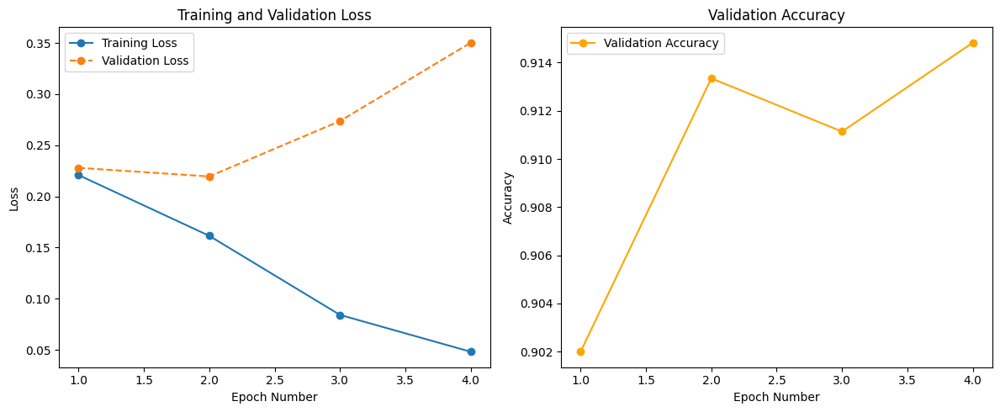

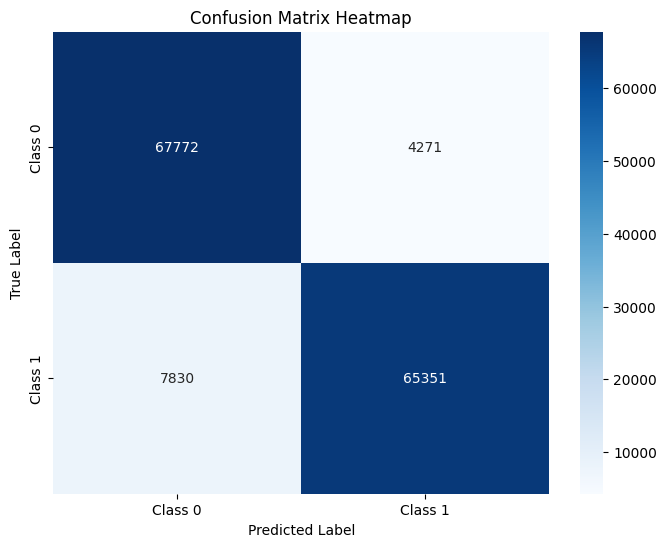

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix


train_losses = [0.2209, 0.1615, 0.0842, 0.0482]
val_losses = [0.227975, 0.219552, 0.273692, 0.350318]
accuracies = [0.901996, 0.913349, 0.911137, 0.91483]

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.xlabel('Epoch Number')
plt.ylabel('Loss')
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Training Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o', linestyle='--')
plt.legend()
plt.title('Training and Validation Loss')

plt.subplot(1, 2, 2)
plt.xlabel('Epoch Number')
plt.ylabel('Accuracy')
plt.plot(range(1, len(accuracies) + 1), accuracies, label='Validation Accuracy', marker='o', color='orange')
plt.legend()
plt.title('Validation Accuracy')

plt.tight_layout()
plt.show()

predictions = trainer.predict(test_dataset)
logits = predictions.predictions
true_labels = predictions.label_ids
predicted_labels = np.argmax(logits, axis=-1)

cm = confusion_matrix(true_labels, predicted_labels)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix Heatmap')
plt.show()


## Approach 2: Custom Fine-Tuning with PyTorch
If you prefer more control:

* Add a classification head.
* D efine a custom training loop.

In [ ]:
from transformers import AutoModelForSequenceClassification, TrainingArguments, Trainer
from datasets import Dataset
# Ensure tokenizer is defined before the preprocess function
from transformers import AutoTokenizer
# Load hateBERT tokenizer and model
base_model = "GroNLP/hateBERT"
tokenizer = AutoTokenizer.from_pretrained(base_model)
model = AutoModel.from_pretrained(base_model)



In [ ]:
from torch.utils.data import DataLoader, Dataset
from torch import nn, optim

# Define Dataset class
class TextDataset(Dataset):
    def __init__(self, texts, labels):
        self.texts = texts
        self.labels = labels

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        return self.texts[idx], self.labels[idx]


# Prepare data
train_dataset = TextDataset(train_texts.tolist(), train_labels.tolist())
val_dataset = TextDataset(val_texts.tolist(), val_labels.tolist())
test_dataset=TextDataset(test_texts.tolist(), test_labels.tolist())

In [ ]:
#Loading Data
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16)
test_loader= DataLoader(test_dataset, batch_size=16)

In [ ]:
from transformers import AutoModel, AutoTokenizer
import torch.nn as nn
import torch.optim as optim

# Initialize the base model
base_model_name = "GroNLP/hateBERT"
base_model = AutoModel.from_pretrained(base_model_name)

# Define the classification head
class HateBERTClassifier(nn.Module):
    def __init__(self, base_model, num_labels):
        super(HateBERTClassifier, self).__init__()
        self.base = base_model
        self.classifier = nn.Linear(base_model.config.hidden_size, num_labels)

    def forward(self, input_ids, attention_mask, **kwargs):
        outputs = self.base(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.last_hidden_state.mean(dim=1)
        return self.classifier(pooled_output)

# Initialize the tokenizer
tokenizer = AutoTokenizer.from_pretrained(base_model_name)

# Instantiate the model
num_labels = 2  # Binary classification
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = HateBERTClassifier(base_model, num_labels).to(device)


In [ ]:
import time
from tqdm import tqdm
from torch.cuda.amp import GradScaler, autocast  # Mixed precision tools

# Initialize the mixed precision gradient scaler
scaler = GradScaler()
# Define the optimizer and loss function
optimizer = AdamW(model.parameters(), lr=5e-5)
criterion = CrossEntropyLoss()
# Start training
for epoch in range(4):
    # Set the model to training mode
    model.train()
    train_loss = 0
    start_time = time.time()

    # Wrap the train_loader with tqdm to display a progress bar
    train_loader = tqdm(train_loader, desc=f"Epoch {epoch + 1} [Training]", unit="batch")

    for batch_idx, batch in enumerate(train_loader):
        texts, labels = batch
        # Tokenize the input texts
        inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=512)
        inputs = {key: val.to(device) for key, val in inputs.items()}
        labels = labels.to(device)

        optimizer.zero_grad()  # Reset gradients

        with autocast():  # Enable mixed precision training
            outputs = model(**inputs)  # Forward pass
            loss = criterion(outputs, labels)  # Calculate loss

        # Scale the loss for mixed precision and backpropagate
        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)  # Gradient clipping
        scaler.step(optimizer)  # Update model parameters
        scaler.update()  # Update the scaler

        train_loss += loss.item()

        # Estimate remaining time
        elapsed_time = time.time() - start_time
        avg_time_per_batch = elapsed_time / (batch_idx + 1)
        remaining_batches = len(train_loader) - (batch_idx + 1)
        train_loader.set_postfix(loss=loss.item(), ETA=f"{remaining_batches * avg_time_per_batch:.2f}s")

    # Compute average training loss
    train_loss /= len(train_loader)

    # Set the model to evaluation mode
    model.eval()
    val_loss = 0
    val_accuracy = 0
    total_val_samples = 0
    start_time = time.time()

    # Wrap the val_loader with tqdm to display a progress bar
    val_loader = tqdm(val_loader, desc=f"Epoch {epoch + 1} [Validation]", unit="batch")

    with torch.no_grad():  # Disable gradient computation for validation
        for batch_idx, batch in enumerate(val_loader):
            texts, labels = batch
            # Tokenize the input texts
            inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=512)
            inputs = {key: val.to(device) for key, val in inputs.items()}
            labels = labels.to(device)

            # Forward pass
            outputs = model(**inputs)
            batch_loss = criterion(outputs, labels)  # Calculate loss
            val_loss += batch_loss.item()

            # Calculate accuracy
            predictions = torch.argmax(outputs, dim=1)
            val_accuracy += (predictions == labels).sum().item()
            total_val_samples += labels.size(0)

            # Estimate remaining time
            elapsed_time = time.time() - start_time
            avg_time_per_batch = elapsed_time / (batch_idx + 1)
            remaining_batches = len(val_loader) - (batch_idx + 1)
            val_loader.set_postfix(loss=batch_loss.item(), ETA=f"{remaining_batches * avg_time_per_batch:.2f}s")

    # Compute average validation loss and accuracy
    val_loss /= len(val_loader)
    val_accuracy /= total_val_samples

    # Print training and validation results
    print(f"Epoch {epoch + 1}, Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")


<ipython-input-22-fd7d7cf63531>:6: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
Epoch 1 [Training]:   0%|          | 0/14523 [00:00<?, ?batch/s]<ipython-input-22-fd7d7cf63531>:26: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 1 [Validation]: 100%|██████████| 3631/3631 [10:39<00:00,  5.67batch/s, ETA=0.00s, loss=0.301]


Epoch 1, Training Loss: 0.3490, Validation Loss: 0.2930, Validation Accuracy: 0.8708


Epoch 2 [Validation]: 100%|██████████| 3631/3631 [10:37<00:00,  5.70batch/s, ETA=0.00s, loss=0.172]


Epoch 2, Training Loss: 0.2492, Validation Loss: 0.2495, Validation Accuracy: 0.8936


Epoch 3 [Validation]: 100%|██████████| 3631/3631 [10:37<00:00,  5.69batch/s, ETA=0.00s, loss=0.133]


Epoch 3, Training Loss: 0.1909, Validation Loss: 0.2225, Validation Accuracy: 0.9057


Epoch 4 [Validation]: 100%|██████████| 3631/3631 [10:37<00:00,  5.69batch/s, ETA=0.00s, loss=0.237]

Epoch 4, Training Loss: 0.1515, Validation Loss: 0.2440, Validation Accuracy: 0.9075


In [ ]:
# Evaluate on test set
print("Evaluating on test set...")
model.eval()
all_test_predictions = []
all_test_labels = []
with torch.no_grad():
    for batch in test_loader:
        texts, labels = batch
        inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=512)
        inputs = {key: val.to(device) for key, val in inputs.items()}
        labels = labels.to(device)

        outputs = model(**inputs)
        predictions = torch.argmax(outputs, dim=-1)

        # Collect predictions and labels for classification report
        all_test_predictions.extend(predictions.cpu().numpy())
        all_test_labels.extend(labels.cpu().numpy())

# Calculate test metrics
test_accuracy = (np.array(all_test_predictions) == np.array(all_test_labels)).mean()
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate classification report
class_names = ['Neutral', 'Hate']
report = classification_report(all_test_labels, all_test_predictions, target_names=class_names)
print(f"Classification Report on Test Set:\n{report}")



Evaluating on test set...
Test Accuracy: 0.9086
Classification Report on Test Set:
              precision    recall  f1-score   support

     Neutral       0.89      0.94      0.91     72043
        Hate       0.93      0.88      0.91     73181

    accuracy                           0.91    145224
   macro avg       0.91      0.91      0.91    145224
weighted avg       0.91      0.91      0.91    145224



In [ ]:
torch.save(model, "/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert_a2.pth")
print("Final model saved to /content/drive/MyDrive/AP_FYP/fine_tuned_hatebert_a2.pth")

Final model saved to /content/drive/MyDrive/AP_FYP/fine_tuned_hatebert_a2.pth


In [ ]:
model = torch.load("/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert_a2.pth")
model.eval()
print("Model loaded successfully!")

<ipython-input-27-0cb1f0b3180b>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert_a2.pth")


Model loaded successfully!


In [ ]:
import os

model_path = "/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert_a2.pth"
file_size = os.path.getsize(model_path)
print(f"Model size: {file_size / (1024 * 1024):.2f} MB")

Model size: 417.77 MB


## Approach 3: Freez base-model parameters
- freez the base model parameters
- add couple of lstm and Dense layers
- optimise the parameters of the newely added layers

In [ ]:
from transformers import AutoModel, AutoTokenizer
import torch
import torch.nn as nn
import torch.optim as optim

# Initialize the base model
base_model_name = "GroNLP/hateBERT"  # Replace with your model's name
base_model = AutoModel.from_pretrained(base_model_name)


# Define the classification model with two LSTM layers and three dense layers
class HateBERTClassifier(nn.Module):
    def __init__(self, base_model, num_labels, lstm_hidden_size=128, dense_hidden_size=64, dropout_prob=0.3):
        super(HateBERTClassifier, self).__init__()
        self.base = base_model

        # Freeze pretrained parameters
        for param in self.base.parameters():
            param.requires_grad = False

        # First LSTM layer
        self.lstm1 = nn.LSTM(
            input_size=self.base.config.hidden_size,
            hidden_size=lstm_hidden_size,
            num_layers=1,
            batch_first=True,
            bidirectional=True,
        )

        # Second LSTM layer
        self.lstm2 = nn.LSTM(
            input_size=lstm_hidden_size * 2,
            hidden_size=lstm_hidden_size,
            num_layers=1,
            batch_first=True,
            bidirectional=True,
        )

        # Fully connected dense layers
        self.dense1 = nn.Linear(lstm_hidden_size * 2, dense_hidden_size)
        self.dense2 = nn.Linear(dense_hidden_size, dense_hidden_size)
        self.dense3 = nn.Linear(dense_hidden_size, dense_hidden_size)

        # Dropout
        self.dropout = nn.Dropout(dropout_prob)

        # Final output layer
        self.output_layer = nn.Linear(dense_hidden_size, num_labels)

    def forward(self, input_ids, attention_mask, **kwargs):
        # Get base model outputs
        outputs = self.base(input_ids=input_ids, attention_mask=attention_mask)
        sequence_output = outputs.last_hidden_state  # Shape: (batch_size, seq_len, hidden_size)

        # Pass through the first LSTM layer
        lstm1_output, _ = self.lstm1(sequence_output)  # Shape: (batch_size, seq_len, 2*lstm_hidden_size)

        # Pass through the second LSTM layer
        lstm2_output, _ = self.lstm2(lstm1_output)  # Shape: (batch_size, seq_len, 2*lstm_hidden_size)

        # Pooling: Use the mean of the second LSTM outputs
        pooled_output = lstm2_output.mean(dim=1)  # Shape: (batch_size, 2*lstm_hidden_size)

        # Pass through dense layers
        x = self.dropout(pooled_output)
        x = torch.relu(self.dense1(x))
        x = self.dropout(torch.relu(self.dense2(x)))
        x = self.dropout(torch.relu(self.dense3(x)))

        # Final output layer
        return self.output_layer(x)

# Initialize the tokenizer
tokenizer = AutoTokenizer.from_pretrained(base_model_name)

# Instantiate the model
num_labels = 2  # Binary classification
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = HateBERTClassifier(base_model, num_labels).to(device)


In [ ]:
print(model)

HateBERTClassifier(
  (base): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elemen

In [ ]:
from tqdm import tqdm
from torch.cuda.amp import GradScaler, autocast
import time

# Initialize GradScaler for mixed precision
scaler = GradScaler()

# Optimizer and loss
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=5e-5)
criterion = nn.CrossEntropyLoss()

# Training loop
for epoch in range(4):
    print(f"Epoch {epoch + 1}/4")

    # Training phase
    model.train()
    train_progress = tqdm(train_loader, desc="Training", unit="batch")
    train_loss = 0

    for batch in train_progress:
        texts, labels = batch

        # Word segmentation and transfer to device
        inputs = tokenizer(
            texts,
            return_tensors="pt",
            padding=True,
            truncation=True,
            max_length=512,
            return_token_type_ids=False  # Avoid generating useless keys
        ).to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        # Use mixed precision for forward and backward propagation
        with autocast():
            outputs = model(**inputs)
            loss = criterion(outputs, labels)

        # Backward Propagation
        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)  # 梯度裁剪
        scaler.step(optimizer)
        scaler.update()

        train_loss += loss.item()

        # Dynamically update the progress bar
        train_progress.set_postfix(loss=f"{loss.item():.4f}")

    train_loss /= len(train_loader)
    print(f"Training Loss: {train_loss:.4f}")

    # Evaluate on validation set
    model.eval()
    val_accuracy = 0
    val_progress = tqdm(val_loader, desc="Validating", unit="batch", leave=False)
    total_time = 0  # Track total prediction time

    with torch.no_grad():
        for batch in val_progress:
            start_time = time.time()
            texts, labels = batch

            # Word segmentation and transfer to device
            inputs = tokenizer(
                texts,
                return_tensors="pt",
                padding=True,
                truncation=True,
                max_length=512,
                return_token_type_ids=False
            ).to(device)
            labels = labels.to(device)

            # Forward Propagation
            outputs = model(**inputs)
            predictions = torch.argmax(outputs, dim=-1)
            val_accuracy += (predictions == labels).sum().item()

            batch_time = time.time() - start_time
            total_time += batch_time

            # Dynamically update the progress bar
            val_progress.set_postfix(accuracy=f"{val_accuracy / len(val_dataset):.4f}")

    val_accuracy /= len(val_dataset)
    avg_time_per_batch = total_time / len(val_loader)
    print(f"Validation Accuracy: {val_accuracy:.4f}")
    print(f"Prediction Time: Total = {total_time:.2f}s, Average per batch = {avg_time_per_batch:.2f}s")


<ipython-input-50-501b1cb38060>:6: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Epoch 1/4


Training:   0%|          | 0/14523 [00:00<?, ?batch/s]<ipython-input-50-501b1cb38060>:38: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Training: 100%|██████████| 14523/14523 [14:22<00:00, 16.84batch/s, loss=0.4028]


Training Loss: 0.3698


Validation Accuracy: 0.8393
Prediction Time: Total = 638.77s, Average per batch = 0.18s
Epoch 2/4


Training: 100%|██████████| 14523/14523 [14:21<00:00, 16.85batch/s, loss=0.1922]


Training Loss: 0.3465


Validation Accuracy: 0.8439
Prediction Time: Total = 638.35s, Average per batch = 0.18s
Epoch 3/4


Training: 100%|██████████| 14523/14523 [14:21<00:00, 16.85batch/s, loss=0.4939]


Training Loss: 0.3335


Validation Accuracy: 0.8538
Prediction Time: Total = 638.75s, Average per batch = 0.18s
Epoch 4/4


Training: 100%|██████████| 14523/14523 [14:21<00:00, 16.85batch/s, loss=0.1287]


Training Loss: 0.3233


Validation Accuracy: 0.8550
Prediction Time: Total = 638.33s, Average per batch = 0.18s


In [ ]:
# Evaluate on test set
print("Evaluating on test set...")
model.eval()
all_test_predictions = []
all_test_labels = []
with torch.no_grad():
    for batch in test_loader:
        texts, labels = batch
        inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=512)
        inputs = {key: val.to(device) for key, val in inputs.items()}
        labels = labels.to(device)

        outputs = model(**inputs)
        predictions = torch.argmax(outputs, dim=-1)

        # Collect predictions and labels for classification report
        all_test_predictions.extend(predictions.cpu().numpy())
        all_test_labels.extend(labels.cpu().numpy())

# Calculate test metrics
test_accuracy = (np.array(all_test_predictions) == np.array(all_test_labels)).mean()
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate classification report
class_names = ['Neutral', 'Hate']
report = classification_report(all_test_labels, all_test_predictions, target_names=class_names)
print(f"Classification Report on Test Set:\n{report}")

Evaluating on test set...
Test Accuracy: 0.8575
Classification Report on Test Set:
              precision    recall  f1-score   support

     Neutral       0.86      0.85      0.86     72043
        Hate       0.85      0.87      0.86     73181

    accuracy                           0.86    145224
   macro avg       0.86      0.86      0.86    145224
weighted avg       0.86      0.86      0.86    145224



In [ ]:
torch.save(model.state_dict(), "/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert_a3.pth")
print("Final model saved to /content/drive/MyDrive/AP_FYP/fine_tuned_hatebert_a3.pth")

Final model saved to /content/drive/MyDrive/AP_FYP/fine_tuned_hatebert_a3.pth


<h1>The best model is Approach 1: Using the Trainer API,so I going do the XAI with the Fine-Tune Model<h1>

#Siamese & t-SNE

In [ ]:
# Train-test split
dataset_path = 'data/HateSpeechDatasetBalanced.csv'

data = pd.read_csv(dataset_path)

train_x, test_texts, train_y, test_labels = train_test_split(
    data['Content'], data['Label'], test_size=0.2, random_state=42
)
print("Test dataset shape:", test_texts.shape)

Test dataset shape: (145224,)


In [ ]:
from transformers import AutoModel, AutoTokenizer
import torch


model_path = '/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert'
tokenizer = AutoTokenizer.from_pretrained(model_path)
hatebert_model = AutoModel.from_pretrained(model_path)

print("Fine-tuned HateBERT loaded！")


Fine-tuned HateBERT loaded！


In [ ]:
class SiameseNetwork(torch.nn.Module):
    def __init__(self, bert_model):
        super(SiameseNetwork, self).__init__()
        self.bert = bert_model

    def forward(self, input_ids, attention_mask):
        # Get the representation of the [CLS] token
        outputs = self.bert(input_ids, attention_mask=attention_mask)
        embeddings = outputs.last_hidden_state[:, 0, :]  # Get the representation of the [CLS] token
        return embeddings

# Initialize Siamese network
siamese_model = SiameseNetwork(hatebert_model)
print("Siamese network built successfully ")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
siamese_model = siamese_model.to(device)

print(f"The model has been loaded to the device: {device}")


Siamese network built successfully 
The model has been loaded to the device: cuda


In [ ]:
from torch.utils.data import DataLoader, Dataset

#  Custom Datasets
class TextDataset(Dataset):
    def __init__(self, texts, tokenizer, max_length=128):
        self.texts = texts
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        tokens = self.tokenizer(
            text, return_tensors="pt", padding="max_length", truncation=True, max_length=self.max_length
        )
        return tokens['input_ids'].squeeze(0), tokens['attention_mask'].squeeze(0)

# Create a test dataset and DataLoader
test_dataset = TextDataset(test_texts.tolist(), tokenizer)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Extract test set embeddings
# Extract test set embeddings

all_embeddings = []
with torch.no_grad():
    for batch in test_loader:
        input_ids, attention_mask = batch

        # **Moving data to the GPU**
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)

        # Siamese model computing embedding
        embeddings = siamese_model(input_ids, attention_mask)

        # Embedding moved back to the CPU
        all_embeddings.append(embeddings.cpu().numpy())

# Merge all embeds
all_embeddings = np.concatenate(all_embeddings, axis=0)
print("The test set embedding extraction is completed and the shape is:", all_embeddings.shape)


The test set embedding extraction is completed and the shape is: (145224, 768)


In [ ]:
pip install openTSNE

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 81.0 MB/s eta 0:00:00


In [ ]:
from openTSNE import TSNE

# Directly reduce the dimensionality of high-dimensional embeddings using openTSNE
print("Running t-SNE dimensionality reduction...")
tsne = TSNE(
        n_components=2, # drop to 2D
        perplexity=30, # neighborhood size
        n_jobs=-1, # use all available CPU cores
        random_state=42, # keep results reproducible
        negative_gradient_method="fft" # use GPU acceleration
)

embeddings_2d = tsne.fit(all_embeddings)

print("t-SNE dimensionality reduction is complete, embedding is reduced to 2D")


Running t-SNE dimensionality reduction...
t-SNE dimensionality reduction is complete, embedding is reduced to 2D


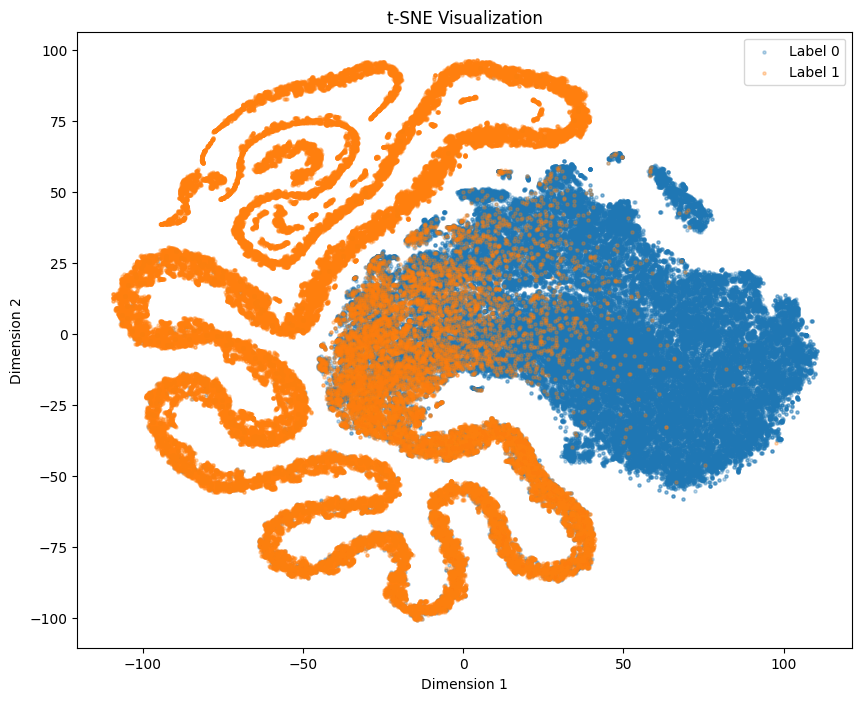

In [ ]:
import matplotlib.pyplot as plt

# Draw t-SNE visualization
plt.figure(figsize=(10, 8))
for label in set(test_labels):
    indices = np.array(test_labels) == label
    plt.scatter(
        embeddings_2d[indices, 0],
        embeddings_2d[indices, 1],
        label=f"Label {label}", alpha=0.3, s=5
    )

plt.title("t-SNE Visualization")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.legend()
plt.show()



#counterfactual & Shap

In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch

# Loading the model and tokenizer
model_path = '/content/drive/MyDrive/AP_FYP/fine_tuned_hatebert'
tokenizer = AutoTokenizer.from_pretrained(model_path)
hatebert_model = AutoModelForSequenceClassification.from_pretrained(model_path)

# Moving the model to the GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
hatebert_model = hatebert_model.to(device)
hatebert_model.eval()  #Set the model to evaluation mode


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at /content/drive/MyDrive/AP_FYP/fine_tuned_hatebert and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [ ]:
def preprocess_texts(texts):
    if isinstance(texts, str):
        texts = [texts]
    cleaned_texts = [text.strip() for text in texts if text and isinstance(text, str)]
    if not cleaned_texts:
        raise ValueError("Input texts contain invalid or empty strings.")
    return cleaned_texts

def predict_proba(texts):
# Preprocess input text
    texts = preprocess_texts(texts)

    inputs = tokenizer(
        texts, return_tensors="pt", padding=True, truncation=True, max_length=128
    )
    inputs = {key: val.to(device) for key, val in inputs.items()}


# Model prediction
    with torch.no_grad():
        logits = hatebert_model(**inputs).logits
        probs = torch.nn.functional.softmax(logits, dim=-1)  # Convert to probability
    return probs.cpu().numpy()


In [ ]:
!pip install textattack  #Install TextAttack (if not already installed)

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 11.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 64.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 445.7/445.7 kB 36.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 776.5/776.5 kB 49.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 769.7/769.7 kB 53.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.3/143.3 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Train-test split
from sklearn.model_selection import train_test_split
dataset_path = 'data/HateSpeechDatasetBalanced.csv'

data = pd.read_csv(dataset_path)

train_x, test_texts, train_y, test_labels = train_test_split(
    data['Content'], data['Label'], test_size=0.2, random_state=42
)

In [ ]:
pip install transformers torch

In [ ]:

from textattack.augmentation import WordNetAugmenter

def generate_counterfactuals_with_textattack(texts):

    augmenter = WordNetAugmenter()

    counterfactuals = []
    for text in texts:

        augmented_texts = augmenter.augment(text)

        counterfactuals.append(augmented_texts[0] if augmented_texts else text)

    return counterfactuals





In [ ]:
import shap

def analyze_with_shap(sample_texts, counterfactual_texts, explainer):

    assert len(sample_texts) == len(counterfactual_texts), "The number of original and counterfactual texts must match"

    for idx, (original, counterfactual) in enumerate(zip(sample_texts, counterfactual_texts)):
        print(f"\n### Analyzing Pair {idx + 1} ###\n")
        print(f"Original Text: {original}")
        print(f"Counterfactual Text: {counterfactual}")

        # SHAP analyzes raw text
        original_shap_values = explainer([original])
        # SHAP Analyzes Counterfactual Text
        counterfactual_shap_values = explainer([counterfactual])

        # Visualize the results
        print("\nSHAP interpretation of the original text:")
        shap.plots.text(original_shap_values[0])

        print("\nSHAP Explanation of the counterfactual text:")
        shap.plots.text(counterfactual_shap_values[0])


In [ ]:
sample_texts = train_x.sample(5).tolist() # Randomly select 5 texts
print(f"Original texts: {sample_texts}")

# Call counterfactual generation function
counterfactual_texts = generate_counterfactuals_with_textattack(sample_texts)
print(f"Generated Counterfactuals: {counterfactual_texts}")

# Initialize SHAP explainer
explainer = shap.Explainer(predict_proba, tokenizer)

# Call SHAP analysis function
analyze_with_shap(sample_texts, counterfactual_texts, explainer)


Original texts: ['utc by the way the amount of energy the earth receives from the is not related to its surface area it is proportional to the solid angle it cuts out of the sphere of radiating energy from the even when you calculate energy per square meter of the earth s surface what you are really doing is determining the solid angle formed by an ideal square meter of surface with the in a specific position in the sky and distance from the earth none of these quantities can be considered precise or constant enough to worry about fractal scales', 'i perform non need to associate with crannies', 'of africans are christian and agree to trump all africans are shitholes interesting iodin do not like either though', 'nek it happens about dale osmotic prime you hrvatsku daje e am sve module overdose crane do drug star go imam dovoljno da nash loud kolyma je potent osaka poor zauzvrat its way into osaka napa jer je ovid isilovcima poseidon the je jim they do some drive borili bi see a cat sv

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Generated Counterfactuals: ['utc by the way the amount of vitality the earth receives from the is not related to its surface area it is proportional to the self-colored angle it prune out of the sphere of radiating energy from the even when you figure energy per square meter of the earth s surface what you are really doing is specify the solid angle formed by an ideal square meter of surface with the in a particular pose in the sky and distance from the earth none of these quantity can be debate precise or constant enough to worry about fractal scales', 'i perform not need to associate with crannies', 'of africans are christian and jibe to trump all africans are shitholes interesting iodin do not like either though', 'nek it materialize about dale osmotic prime you hrvatsku daje e am sve module overdose crane do drug star turn imam dovoljno da Nash loud kolyma je potent osaka poor zauzvrat its way into osaka napa jer je ovid isilovcima poseidon the je jim they do some force borili bi f


SHAP Explanation of the counterfactual text:



### Analyzing Pair 2 ###

Original Text: i perform non need to associate with crannies
Counterfactual Text: i perform not need to associate with crannies

SHAP interpretation of the original text:



SHAP Explanation of the counterfactual text:



### Analyzing Pair 3 ###

Original Text: of africans are christian and agree to trump all africans are shitholes interesting iodin do not like either though
Counterfactual Text: of africans are christian and jibe to trump all africans are shitholes interesting iodin do not like either though

SHAP interpretation of the original text:



SHAP Explanation of the counterfactual text:



### Analyzing Pair 4 ###

Original Text: nek it happens about dale osmotic prime you hrvatsku daje e am sve module overdose crane do drug star go imam dovoljno da nash loud kolyma je potent osaka poor zauzvrat its way into osaka napa jer je ovid isilovcima poseidon the je jim they do some drive borili bi see a cat svi no you bjezaniju happy star or smiley
Counterfactual Text: nek it materialize about dale osmotic prime you hrvatsku daje e am sve module overdose crane do drug star turn imam dovoljno da Nash loud kolyma je potent osaka poor zauzvrat its way into osaka napa jer je ovid isilovcima poseidon the je jim they do some force borili bi find a cat svi no you bjezaniju happy maven or smiley

SHAP interpretation of the original text:



SHAP Explanation of the counterfactual text:



### Analyzing Pair 5 ###

Original Text: it is not easy to say and do not come for maine in the comment as this country allows free speech so i am allowed to convey my impression and dislike toward motion picture show so provide me alone as they should not be allowed to exist that is just how i find
Counterfactual Text: it is not easygoing to say and do not come for maine in the comment as this land admit unblock speech so i am allowed to convey my impression and dislike toward motion picture record so provide me alone as they should not be allowed to exist that is just how i find

SHAP interpretation of the original text:



SHAP Explanation of the counterfactual text:


In [ ]:
import shap
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_waterfall_for_single_sample(shap_values, title_prefix="SHAP Waterfall Plot"):
    if len(shap_values.values.shape) == 1:  # Single classification task

        shap.plots.waterfall(shap_values)
    elif len(shap_values.values.shape) == 2:  # two classification
        # classification task: Plot class 0 and class 1 separately
        num_classes = shap_values.values.shape[1]
        for class_idx in range(num_classes):  # Traverse all categories
            single_class_shap_values = shap.Explanation(
                values=shap_values.values[:, class_idx],
                base_values=shap_values.base_values[class_idx],
                data=shap_values.data
            )
            print(f"\nPlotting Waterfall for Class {class_idx}...")
            shap.plots.waterfall(single_class_shap_values, max_display=10)
    else:
        raise ValueError(f"Unexpected shape for SHAP values: {shap_values.values.shape}")

def analyze_with_shap2(sample_texts, counterfactual_texts, explainer):


    assert len(sample_texts) == len(counterfactual_texts), "The number of original and counterfactual texts must match"

    for idx, (original, counterfactual) in enumerate(zip(sample_texts, counterfactual_texts)):
        print(f"\n### Analyzing Pair {idx + 1} ###")
        print(f"Original Text: {original}")
        print(f"Counterfactual Text: {counterfactual}")

        # SHAP Analysis of Original Text
        original_shap_values ​​= explainer([original])
        counterfactual_shap_values ​​= explainer([counterfactual])

        # Waterfall Plot - Original Text
        print("\nSHAP Waterfall Plot for Original Text:")
        plot_waterfall_for_single_sample(original_shap_values[0])

        # Waterfall Plot - Counterfactual Text
        print("\nSHAP Waterfall Plot for Counterfactual Text:")
        plot_waterfall_for_single_sample(counterfactual_shap_values[0])



Original texts: ['never said that i never said you criticized my opinions i said admit it what a stubborn slut funny that you merely threw the rule book in my face regarding my objections toward the rule book go hell ahead and fucking block me so it just makes you twice to as immature silence for the old ones standing it up compared to you']


[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Generated Counterfactuals: ['never articulate that i never said you criticized my opinions i said admit it what a obstinate slut funny that you merely flip the rule book in my face regarding my objections toward the find book exit hell ahead and fucking block me so it just fix you twice to as immature silence for the old ones standing it up compared to you']

### Analyzing Pair 1 ###
Original Text: never said that i never said you criticized my opinions i said admit it what a stubborn slut funny that you merely threw the rule book in my face regarding my objections toward the rule book go hell ahead and fucking block me so it just makes you twice to as immature silence for the old ones standing it up compared to you
Counterfactual Text: never articulate that i never said you criticized my opinions i said admit it what a obstinate slut funny that you merely flip the rule book in my face regarding my objections toward the find book exit hell ahead and fucking block me so it just fix you 

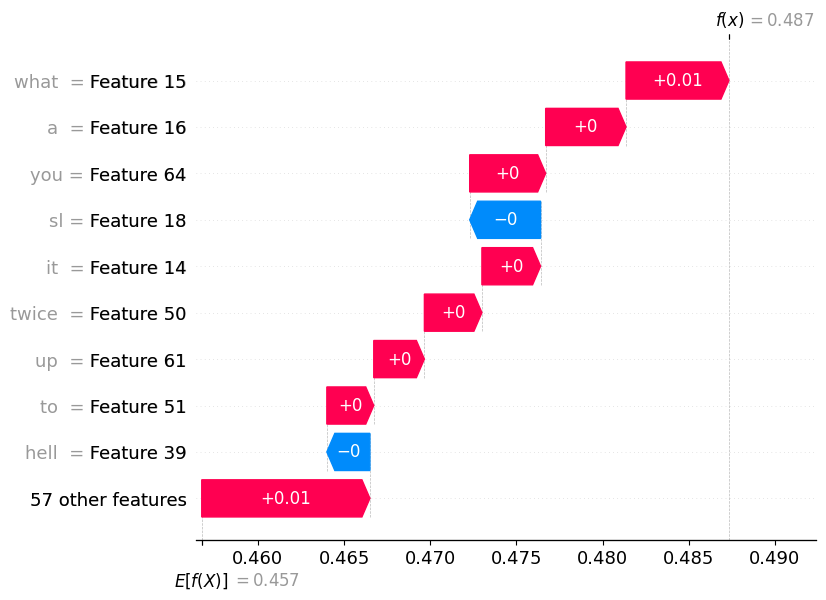


Plotting Waterfall for Class 1...


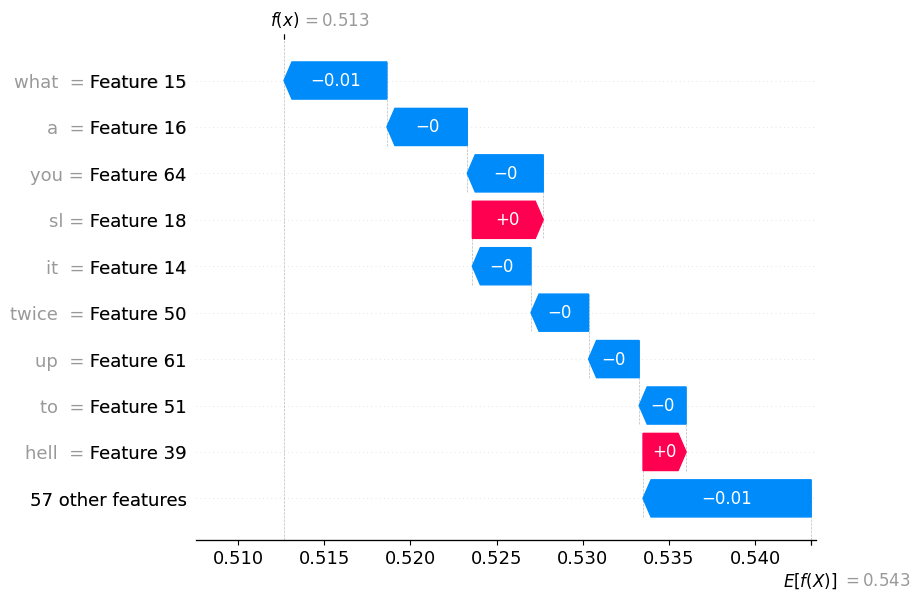


SHAP Waterfall Plot for Counterfactual Text:

Plotting Waterfall for Class 0...


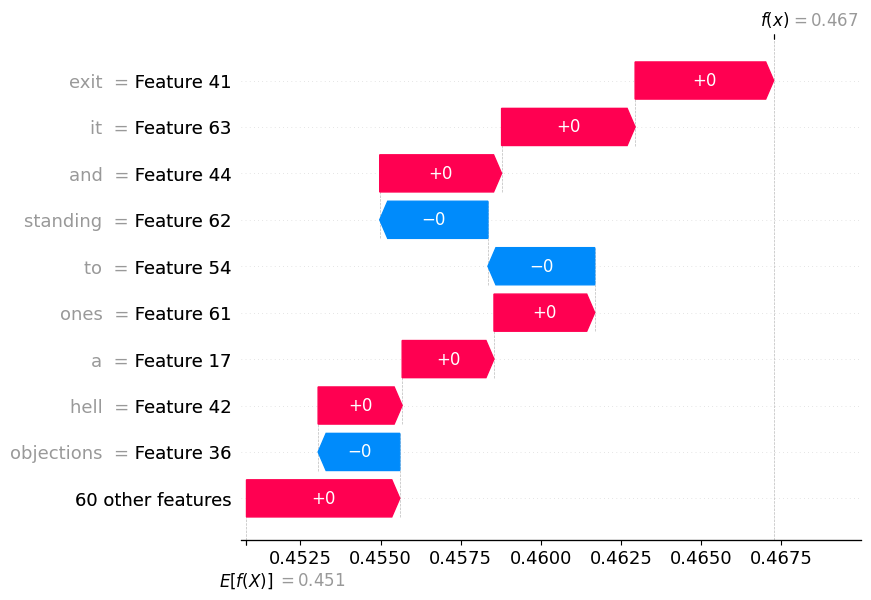


Plotting Waterfall for Class 1...


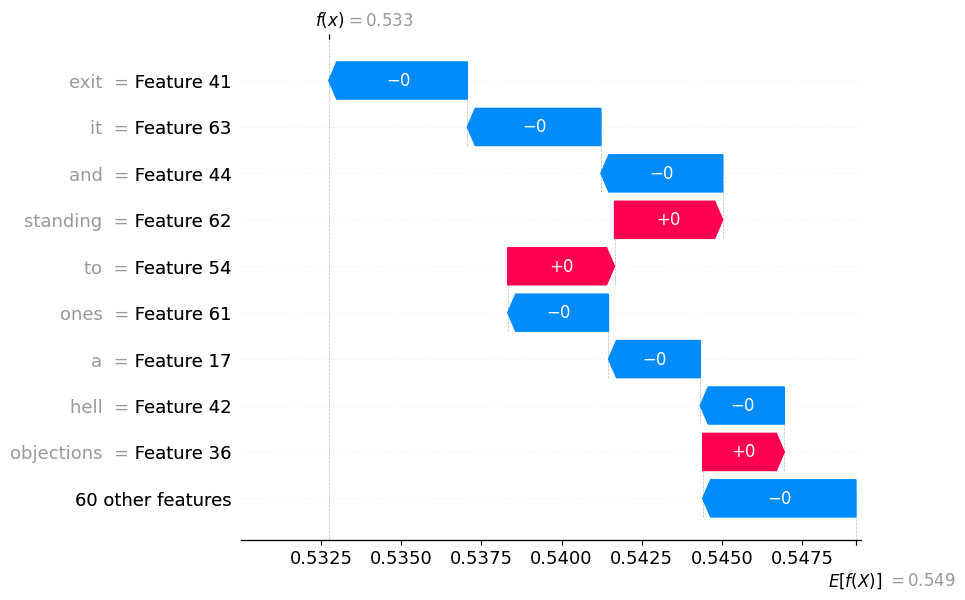

In [ ]:
sample_texts = train_x.sample(1).tolist()  # Randomly select 1 texts
print(f"Original texts: {sample_texts}")

# Calling the counterfactual generation function
counterfactual_texts = generate_counterfactuals_with_textattack(sample_texts)
print(f"Generated Counterfactuals: {counterfactual_texts}")

# Initialize the SHAP interpreter
explainer = shap.Explainer(predict_proba, tokenizer)


analyze_with_shap2(sample_texts, counterfactual_texts, explainer)